In [1]:
import sys
sys.path.append('..')
sys.path.append("..")
sys.path.append("../dl")

import torch
import segmentation_models_pytorch as smp
from omegaconf import OmegaConf
from torch import nn

from config import conf
from inferer import *
from lightning_model import *

/home/leos/.local/lib/python3.6/site-packages/pandas/compat/_optional.py:106: UserWarning: Pandas requires version '1.2.1' or newer of 'bottleneck' (version '1.2.0' currently installed).
  warnings.warn(msg, UserWarning)
/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192

/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning:

can't resolve package from 

In [2]:
model = smp.FPN(
    encoder_name="resnext50_32x4d",
    classes=2,
    decoder_merge_policy='cat'
)

PATH = Path(conf['paths']['experiment_root_dir'])
PATH = PATH.joinpath((f"{conf['training_args']['model_name']}/"
                      f"version_{conf['training_args']['experiment_version']}"))
PATH = PATH.joinpath(f"last.ckpt")

segmodel = SegModel.from_conf(model, conf)
checkpoint = torch.load(PATH, map_location = lambda storage, loc : storage)
segmodel.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [3]:
inf = Inferer.from_conf(segmodel, conf)

In [4]:
infobj = inf.run()

Prediction for: TCGA-2Z-A9J9-01A-01-TS1


/home/leos/.local/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function extract_patches is deprecated; The function feature_extraction.image.extract_patches has been deprecated in 0.22 and will be removed in 0.24.



Prediction for: TCGA-44-2665-01B-06-BS6
Prediction for: TCGA-69-7764-01A-01-TS1
Prediction for: TCGA-A6-6782-01A-01-BS1
Prediction for: TCGA-AC-A2FO-01A-01-TS1
Prediction for: TCGA-AO-A0J2-01A-01-BSA
Prediction for: TCGA-CU-A0YN-01A-02-BSB
Prediction for: TCGA-EJ-A46H-01A-03-TSC
Prediction for: TCGA-FG-A4MU-01B-01-TS1
Prediction for: TCGA-GL-6846-01A-01-BS1
Prediction for: TCGA-HC-7209-01A-01-TS1
Prediction for: TCGA-HT-8564-01Z-00-DX1
Prediction for: TCGA-IZ-8196-01A-01-BS1
Prediction for: TCGA-ZF-A9R5-01A-01-TS1


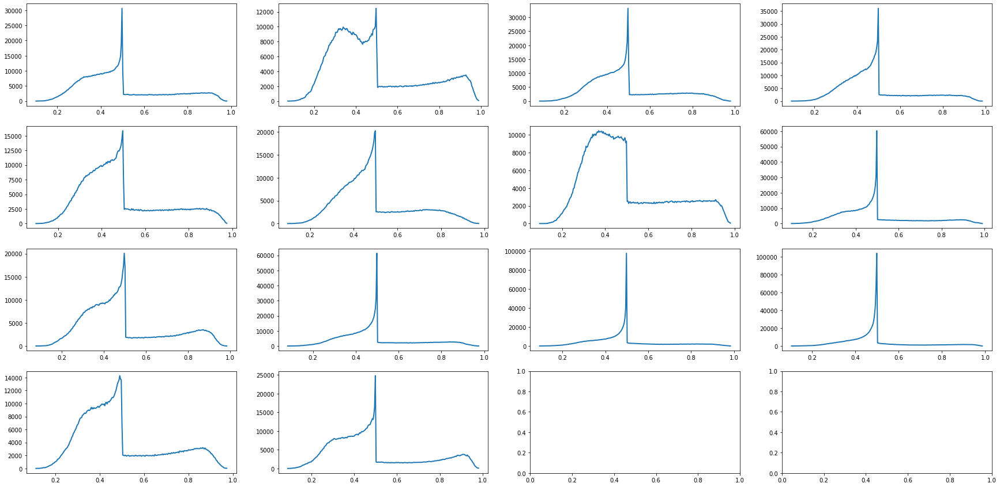

In [5]:
inf.plot_histograms()

In [6]:
# inf.save_outputs('pöö/pö/pöö/image.png')

In [7]:
# inf.plot_predictions()

In [8]:
inf.post_process()

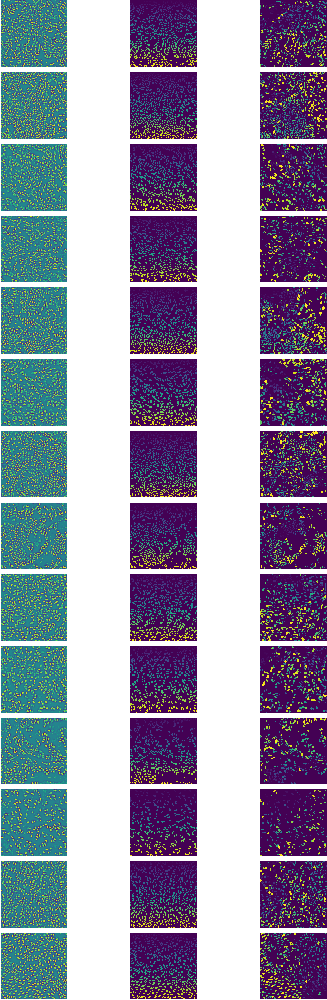

In [9]:
inf.plot_segmentations()

In [10]:
inf.benchmark()

,AJI,AJI plus,DICE2,PQ,SQ,DQ,inst Sensitivity,inst Precision,splits,merges
TCGA-2Z-A9J9-01A-01-TS1_metrics,0.605395,0.612578,0.780212,0.584180,0.726663,0.803922,0.855652,0.758089,0.940001,0.749955
TCGA-44-2665-01B-06-BS6_metrics,0.639369,0.648590,0.757065,0.634918,0.725746,0.874850,0.888753,0.861374,0.641933,1.133885
TCGA-69-7764-01A-01-TS1_metrics,0.595156,0.595382,0.766766,0.575210,0.745775,0.771292,0.913832,0.667219,0.984060,0.722669
TCGA-A6-6782-01A-01-BS1_metrics,0.541789,0.558561,0.737778,0.535665,0.739369,0.724490,0.804989,0.658627,1.001416,0.448364
TCGA-AC-A2FO-01A-01-TS1_metrics,0.552538,0.553405,0.716438,0.518071,0.675616,0.766812,0.842610,0.703526,0.892757,1.230755
TCGA-AO-A0J2-01A-01-BSA_metrics,0.593531,0.602362,0.761118,0.527478,0.723500,0.729064,0.831461,0.649123,0.890767,0.826101
TCGA-CU-A0YN-01A-02-BSB_metrics,0.594680,0.596196,0.778625,0.589429,0.729084,0.808451,0.847858,0.772544,0.867386,0.956511
TCGA-EJ-A46H-01A-03-TSC_metrics,0.577413,0.583337,0.778525,0.580929,0.735611,0.789724,0.890558,0.709402,0.909354,0.516606
TCGA-FG-A4MU-01B-01-TS1_metrics,0.657570,0.663138,0.773451,0.614752,0.752302,0.817160,0.860215,0.778210,0.731704,0.686819
TCGA-GL-6846-01A-01-BS1_metrics,0.670491,0.671928,0.789849,0.644975,0.767264,0.840617,0.921127,0.773050,0.701765,0.583837
